Assignment-04 Objectives:

   1. Develop a simple CNN Image Segmentation model using the COCO 2017 sample dataset and save the trained model.
   2. Using the saved model and sample dataset, build a Streamlit web app featuring image background removal to keep foreground objects.

Additional Instructions:
- The app design is your choice, but it must fully meet the assignment objectives.
- Use the COCO 2017 sample dataset for both training and the Streamlit app.

In [8]:
# Core PyTorch libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

# Image processing
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# COCO dataset handling
from pycocotools.coco import COCO
import pycocotools.mask as maskUtils

# Utilities
import os
import json
from tqdm import tqdm
import random

# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cpu


In [9]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Seting  project path if not found the datset folder we have chnage path manualy
PROJECT_PATH = '/content/drive/MyDrive/CocoSegmentationProject'
DATASET_PATH = os.path.join(PROJECT_PATH, 'coco_dataset')

# Check if dataset exists
if os.path.exists(DATASET_PATH):
    print(" Dataset found!")
    print(f"Dataset location: {DATASET_PATH}")

    # List folders inside dataset
    folders = os.listdir(DATASET_PATH)
    print(f"Folders inside: {folders}")
else:
    print(" Dataset NOT found! Check the path.")

Mounted at /content/drive
 Dataset found!
Dataset location: /content/drive/MyDrive/CocoSegmentationProject/coco_dataset
Folders inside: ['SAMPLE_DATA']


In [10]:
# Checking inside SAMPLE_DATA
SAMPLE_DATA_PATH = os.path.join(DATASET_PATH, 'SAMPLE_DATA')

if os.path.exists(SAMPLE_DATA_PATH):
    contents = os.listdir(SAMPLE_DATA_PATH)
    print(f"Contents inside SAMPLE_DATA: {contents}")

    # Check each folder
    for folder in contents:
        folder_path = os.path.join(SAMPLE_DATA_PATH, folder)
        if os.path.isdir(folder_path):

            # Count files if it's a folder
            num_files = len(os.listdir(folder_path))
            print(f" {folder}: {num_files} items")
else:
    print("SAMPLE_DATA folder not found")

Contents inside SAMPLE_DATA: ['train2017', 'annotations', 'val2017', 'test2017', 'data']
 train2017: 11835 items
 annotations: 6 items
 val2017: 502 items
 test2017: 4073 items
 data: 3 items


In [11]:
PROJECT_PATH = '/content/drive/MyDrive/CocoSegmentationProject'
DATASET_PATH = os.path.join(PROJECT_PATH, 'coco_dataset', 'SAMPLE_DATA')

TRAIN_IMG_PATH = os.path.join(DATASET_PATH, 'train2017')
VAL_IMG_PATH = os.path.join(DATASET_PATH, 'val2017')
TRAIN_ANN_PATH = os.path.join(DATASET_PATH, 'annotations', 'instances_train2017.json')
VAL_ANN_PATH = os.path.join(DATASET_PATH, 'annotations', 'instances_val2017.json')

MODEL_SAVE_PATH = os.path.join(PROJECT_PATH, 'model.pth')

print("Paths configured successfully!")

Paths configured successfully!


In [12]:
class COCOSegmentationDataset(Dataset):
    """
    Custom Dataset for COCO image segmentation
    Returns: image and binary mask (foreground/background)
    """
    def __init__(self, img_dir, ann_file, transform=None, img_size=256, max_samples=None):
        self.img_dir = img_dir
        self.coco = COCO(ann_file)
        self.transform = transform
        self.img_size = img_size

        # Get all image IDs that have annotations
        self.img_ids = []
        for img_id in self.coco.imgs.keys():
            ann_ids = self.coco.getAnnIds(imgIds=img_id)
            if len(ann_ids) > 0:  # Only include images with annotations
                self.img_ids.append(img_id)

        # Limit dataset size if specified
        if max_samples and max_samples < len(self.img_ids):
            self.img_ids = self.img_ids[:max_samples]

        print(f"Dataset initialized with {len(self.img_ids)} images")

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        # Get image info
        img_id = self.img_ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_dir, img_info['file_name'])

        # Load image with error handling
        image = cv2.imread(img_path)

        # Check if image loaded successfully
        if image is None:
            print(f"Warning: Could not load image {img_path}. Using random image.")
            # Return a random valid sample instead
            random_idx = random.randint(0, len(self.img_ids) - 1)
            return self.__getitem__(random_idx)

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w = image.shape[:2]

        # Create empty mask
        mask = np.zeros((h, w), dtype=np.uint8)

        # Get all annotations for this image
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)

        # Combine all object masks into one binary mask
        for ann in anns:
            if 'segmentation' in ann:
                try:
                    # Convert COCO annotation to binary mask
                    rle = maskUtils.frPyObjects(ann['segmentation'], h, w)
                    m = maskUtils.decode(rle)
                    if len(m.shape) == 3:
                        m = m.max(axis=2)  # Take max if multiple channels
                    mask = np.maximum(mask, m)
                except Exception as e:
                    # Skip problematic annotations
                    continue

        # Resize image and mask
        image = cv2.resize(image, (self.img_size, self.img_size))
        mask = cv2.resize(mask, (self.img_size, self.img_size))

        # Convert to tensors
        image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
        mask = torch.from_numpy(mask).float().unsqueeze(0)

        return image, mask


In [13]:
class DoubleConv(nn.Module):
    """Double Convolution block: Conv -> BatchNorm -> ReLU -> Conv -> BatchNorm -> ReLU"""
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    """
    Simple U-Net architecture for image segmentation
    Encoder: Downsample and extract features
    Decoder: Upsample and generate mask
    """
    def __init__(self, in_channels=3, out_channels=1):
        super(UNet, self).__init__()

        # Encoder (Downsampling)
        self.enc1 = DoubleConv(in_channels, 64)
        self.enc2 = DoubleConv(64, 128)
        self.enc3 = DoubleConv(128, 256)
        self.enc4 = DoubleConv(256, 512)

        self.pool = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)

        # Decoder (Upsampling)
        self.upconv4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.dec4 = DoubleConv(1024, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = DoubleConv(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = DoubleConv(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        # Output layer
        self.out = nn.Conv2d(64, out_channels, 1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))

        # Bottleneck
        b = self.bottleneck(self.pool(e4))

        # Decoder with skip connections
        d4 = self.upconv4(b)
        d4 = torch.cat([d4, e4], dim=1)
        d4 = self.dec4(d4)

        d3 = self.upconv3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)

        d2 = self.upconv2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.upconv1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        # Output
        out = torch.sigmoid(self.out(d1))
        return out

In [14]:
def train_model(model, train_loader, val_loader, num_epochs=10, learning_rate=0.001):
    """
    Train the segmentation model
    """
    criterion = nn.BCELoss()  # Binary Cross Entropy Loss
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_losses = []
    val_losses = []

    print("Starting training...")

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]"):
            images = images.to(device)
            masks = masks.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, masks)

            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        avg_train_loss = train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation phase
        model.eval()
        val_loss = 0.0

        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]"):
                images = images.to(device)
                masks = masks.to(device)

                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    return train_losses, val_losses

In [15]:
def visualize_predictions(model, dataset, num_samples=3):
    """
    Visualize model predictions
    """
    model.eval()

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))

    for i in range(num_samples):
        idx = random.randint(0, len(dataset)-1)
        image, mask = dataset[idx]

        # Get prediction
        with torch.no_grad():
            pred_mask = model(image.unsqueeze(0).to(device))
            pred_mask = pred_mask.squeeze().cpu().numpy()

        # Plot
        axes[i, 0].imshow(image.permute(1, 2, 0))
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mask.squeeze(), cmap='gray')
        axes[i, 1].set_title("Ground Truth Mask")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(pred_mask, cmap='gray')
        axes[i, 2].set_title("Predicted Mask")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

INITIALIZING DATASETS
loading annotations into memory...
Done (t=25.54s)
creating index...
index created!
Dataset initialized with 500 images
loading annotations into memory...
Done (t=1.83s)
creating index...
index created!
Dataset initialized with 50 images
Train batches: 63
Val batches: 7

INITIALIZING MODEL
Model parameters: 31,043,521

STARTING TRAINING
Starting training...


Epoch 1/5 [Train]:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 1/5 [Train]:   2%|▏         | 1/63 [01:07<1:09:59, 67.73s/it]

Epoch 1/5 [Train]:   3%|▎         | 2/63 [02:03<1:01:33, 60.56s/it]

Epoch 1/5 [Train]:   5%|▍         | 3/63 [02:56<57:03, 57.06s/it]  

Epoch 1/5 [Train]:   6%|▋         | 4/63 [03:50<55:03, 55.99s/it]

Epoch 1/5 [Train]:   8%|▊         | 5/63 [04:47<54:34, 56.46s/it]

Epoch 1/5 [Train]:  10%|▉         | 6/63 [05:49<55:10, 58.08s/it]

Epoch 1/5 [Train]:  11%|█         | 7/63 [06:43<53:08, 56.94s/it]

Epoch 1/5 [Train]:  13%|█▎        | 8/63 [07:37<51:21, 56.03s/it]

Epoch 1/5 [Train]:  14%|█▍        | 9/63 [08:30<49:37, 55.14s/it]

Epoch 1/5 [Train]:  16%|█▌        | 10/63 [09:26<48:50, 55.30s/it]

Epoch 1/5 [Train]:  17%|█▋        | 11/63 [10:18<47:04, 54.31s/it]

Epoch 1/5 [Train]:  19%|█▉        | 12/63 [11:13<46:23, 54.58s/it]

Epoch 1/5 [Train]:  21%|██        | 13/63 [12:06<44:54, 53.89s/it]

Epoch 1/5 [Train]:  22%|██▏       | 14/63 [12:59<43:56, 53.81s/it]

Epoch 1/5 [Train]:  24%|██▍       | 15/63 [13:51<42:40, 53.34s/it]

Epoch 1/5 [Train]:  25%|██▌       | 16/63 [14:46<42:07, 53.78s/it]

Epoch 1/5 [Train]:  27%|██▋       | 17/63 [15:55<44:39, 58.24s/it]

Epoch 1/5 [Train]:  29%|██▊       | 18/63 [16:49<42:38, 56.87s/it]

Epoch 1/5 [Train]:  30%|███       | 19/63 [17:42<40:50, 55.70s/it]

Epoch 1/5 [Train]:  32%|███▏      | 20/63 [18:35<39:27, 55.07s/it]

Epoch 1/5 [Train]:  33%|███▎      | 21/63 [19:28<38:03, 54.38s/it]

Epoch 1/5 [Train]:  35%|███▍      | 22/63 [20:23<37:15, 54.52s/it]

Epoch 1/5 [Train]:  37%|███▋      | 23/63 [21:16<36:07, 54.18s/it]

Epoch 1/5 [Train]:  38%|███▊      | 24/63 [22:10<35:05, 53.99s/it]

Epoch 1/5 [Train]:  40%|███▉      | 25/63 [23:04<34:11, 53.98s/it]

Epoch 1/5 [Train]:  41%|████▏     | 26/63 [23:58<33:23, 54.16s/it]

Epoch 1/5 [Train]:  43%|████▎     | 27/63 [24:54<32:44, 54.57s/it]

Epoch 1/5 [Train]:  44%|████▍     | 28/63 [26:03<34:27, 59.06s/it]

Epoch 1/5 [Train]:  46%|████▌     | 29/63 [27:01<33:10, 58.55s/it]

Epoch 1/5 [Train]:  48%|████▊     | 30/63 [27:55<31:26, 57.17s/it]

Epoch 1/5 [Train]:  49%|████▉     | 31/63 [28:48<29:52, 56.01s/it]

Epoch 1/5 [Train]:  51%|█████     | 32/63 [29:42<28:38, 55.45s/it]

Epoch 1/5 [Train]:  52%|█████▏    | 33/63 [30:35<27:22, 54.74s/it]

Epoch 1/5 [Train]:  54%|█████▍    | 34/63 [31:28<26:13, 54.26s/it]

Epoch 1/5 [Train]:  56%|█████▌    | 35/63 [32:23<25:21, 54.34s/it]

Epoch 1/5 [Train]:  57%|█████▋    | 36/63 [33:18<24:37, 54.72s/it]

Epoch 1/5 [Train]:  59%|█████▊    | 37/63 [34:11<23:29, 54.20s/it]

Epoch 1/5 [Train]:  60%|██████    | 38/63 [35:05<22:33, 54.13s/it]

Epoch 1/5 [Train]:  62%|██████▏   | 39/63 [36:09<22:45, 56.89s/it]

Epoch 1/5 [Train]:  63%|██████▎   | 40/63 [37:04<21:36, 56.37s/it]

Epoch 1/5 [Train]:  65%|██████▌   | 41/63 [37:59<20:33, 56.07s/it]

Epoch 1/5 [Train]:  67%|██████▋   | 42/63 [38:51<19:08, 54.70s/it]

Epoch 1/5 [Train]:  68%|██████▊   | 43/63 [39:47<18:23, 55.19s/it]

Epoch 1/5 [Train]:  70%|██████▉   | 44/63 [40:42<17:28, 55.21s/it]

Epoch 1/5 [Train]:  71%|███████▏  | 45/63 [41:36<16:23, 54.62s/it]

Epoch 1/5 [Train]:  73%|███████▎  | 46/63 [42:29<15:22, 54.28s/it]

Epoch 1/5 [Train]:  75%|███████▍  | 47/63 [43:24<14:31, 54.45s/it]

Epoch 1/5 [Train]:  76%|███████▌  | 48/63 [44:18<13:37, 54.50s/it]

Epoch 1/5 [Train]:  78%|███████▊  | 49/63 [45:10<12:32, 53.74s/it]

Epoch 1/5 [Train]:  79%|███████▉  | 50/63 [46:12<12:09, 56.15s/it]

Epoch 1/5 [Train]:  81%|████████  | 51/63 [47:07<11:08, 55.74s/it]

Epoch 1/5 [Train]:  83%|████████▎ | 52/63 [48:02<10:09, 55.41s/it]

Epoch 1/5 [Train]:  84%|████████▍ | 53/63 [48:57<09:14, 55.45s/it]

Epoch 1/5 [Train]:  86%|████████▌ | 54/63 [49:53<08:19, 55.55s/it]

Epoch 1/5 [Train]:  87%|████████▋ | 55/63 [50:48<07:22, 55.35s/it]

Epoch 1/5 [Train]:  89%|████████▉ | 56/63 [51:41<06:22, 54.62s/it]

Epoch 1/5 [Train]:  90%|█████████ | 57/63 [52:36<05:29, 54.84s/it]

Epoch 1/5 [Train]:  92%|█████████▏| 58/63 [53:32<04:36, 55.21s/it]

Epoch 1/5 [Val]:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 1/5 [Val]:  14%|█▍        | 1/7 [00:26<02:41, 26.84s/it]

Epoch 1/5 [Val]:  29%|██▊       | 2/7 [00:43<01:45, 21.12s/it]

Epoch 1/5 [Val]: 100%|██████████| 7/7 [01:53<00:00, 16.28s/it]


Epoch [1/5] - Train Loss: 0.5281, Val Loss: 0.4349


Epoch 2/5 [Train]:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 2/5 [Train]:   2%|▏         | 1/63 [01:09<1:12:01, 69.71s/it]

Epoch 2/5 [Train]:   3%|▎         | 2/63 [02:09<1:04:47, 63.73s/it]

Epoch 2/5 [Train]:   5%|▍         | 3/63 [03:06<1:00:53, 60.90s/it]

Epoch 2/5 [Train]:   6%|▋         | 4/63 [04:06<59:14, 60.24s/it]  

Epoch 2/5 [Train]:   8%|▊         | 5/63 [05:01<56:35, 58.54s/it]

Epoch 2/5 [Train]:  10%|▉         | 6/63 [05:58<54:57, 57.85s/it]

Epoch 2/5 [Train]:  11%|█         | 7/63 [06:53<53:07, 56.91s/it]

Epoch 2/5 [Train]:  13%|█▎        | 8/63 [07:45<50:57, 55.60s/it]

Epoch 2/5 [Train]:  14%|█▍        | 9/63 [08:43<50:38, 56.27s/it]

Epoch 2/5 [Train]:  16%|█▌        | 10/63 [09:37<49:09, 55.66s/it]

Epoch 2/5 [Train]:  17%|█▋        | 11/63 [10:35<48:40, 56.16s/it]

Epoch 2/5 [Train]:  19%|█▉        | 12/63 [11:30<47:37, 56.03s/it]

Epoch 2/5 [Train]:  21%|██        | 13/63 [12:26<46:35, 55.91s/it]

Epoch 2/5 [Train]:  22%|██▏       | 14/63 [13:20<45:14, 55.39s/it]

Epoch 2/5 [Train]:  24%|██▍       | 15/63 [14:17<44:32, 55.67s/it]

Epoch 2/5 [Train]:  25%|██▌       | 16/63 [15:10<43:05, 55.01s/it]

Epoch 2/5 [Train]:  27%|██▋       | 17/63 [16:08<42:47, 55.81s/it]

Epoch 2/5 [Train]:  29%|██▊       | 18/63 [17:02<41:37, 55.51s/it]

Epoch 2/5 [Train]:  30%|███       | 19/63 [17:59<40:51, 55.73s/it]

Epoch 2/5 [Train]:  32%|███▏      | 20/63 [18:55<40:03, 55.89s/it]

Epoch 2/5 [Train]:  33%|███▎      | 21/63 [19:49<38:47, 55.42s/it]

Epoch 2/5 [Train]:  35%|███▍      | 22/63 [20:46<38:11, 55.89s/it]

Epoch 2/5 [Train]:  37%|███▋      | 23/63 [21:43<37:24, 56.10s/it]

Epoch 2/5 [Train]:  38%|███▊      | 24/63 [22:46<37:46, 58.11s/it]

Epoch 2/5 [Train]:  40%|███▉      | 25/63 [23:39<35:48, 56.55s/it]

Epoch 2/5 [Train]:  41%|████▏     | 26/63 [24:38<35:18, 57.26s/it]

Epoch 2/5 [Train]:  43%|████▎     | 27/63 [25:36<34:36, 57.69s/it]

Epoch 2/5 [Train]:  44%|████▍     | 28/63 [26:33<33:32, 57.50s/it]

Epoch 2/5 [Train]:  46%|████▌     | 29/63 [27:31<32:35, 57.50s/it]

Epoch 2/5 [Train]:  48%|████▊     | 30/63 [28:26<31:11, 56.70s/it]

Epoch 2/5 [Train]:  49%|████▉     | 31/63 [29:21<30:03, 56.36s/it]

Epoch 2/5 [Train]:  51%|█████     | 32/63 [30:16<28:49, 55.78s/it]

Epoch 2/5 [Train]:  52%|█████▏    | 33/63 [31:11<27:50, 55.69s/it]

Epoch 2/5 [Train]:  54%|█████▍    | 34/63 [32:07<26:58, 55.80s/it]

Epoch 2/5 [Train]:  56%|█████▌    | 35/63 [33:08<26:43, 57.26s/it]

Epoch 2/5 [Train]:  57%|█████▋    | 36/63 [34:02<25:23, 56.42s/it]

Epoch 2/5 [Train]:  59%|█████▊    | 37/63 [34:59<24:25, 56.38s/it]

Epoch 2/5 [Train]:  60%|██████    | 38/63 [35:54<23:25, 56.22s/it]

Epoch 2/5 [Train]:  62%|██████▏   | 39/63 [36:50<22:27, 56.15s/it]

Epoch 2/5 [Train]:  63%|██████▎   | 40/63 [37:44<21:16, 55.49s/it]

Epoch 2/5 [Train]:  65%|██████▌   | 41/63 [38:41<20:30, 55.92s/it]

Epoch 2/5 [Train]:  67%|██████▋   | 42/63 [39:36<19:27, 55.59s/it]

Epoch 2/5 [Train]:  68%|██████▊   | 43/63 [40:32<18:30, 55.55s/it]

Epoch 2/5 [Train]:  70%|██████▉   | 44/63 [41:28<17:40, 55.80s/it]

Epoch 2/5 [Train]:  71%|███████▏  | 45/63 [42:22<16:35, 55.29s/it]

Epoch 2/5 [Train]:  73%|███████▎  | 46/63 [43:19<15:46, 55.66s/it]

Epoch 2/5 [Train]:  75%|███████▍  | 47/63 [44:14<14:50, 55.67s/it]

Epoch 2/5 [Train]:  76%|███████▌  | 48/63 [45:09<13:52, 55.49s/it]

Epoch 2/5 [Train]:  78%|███████▊  | 49/63 [46:06<12:59, 55.71s/it]

Epoch 2/5 [Train]:  79%|███████▉  | 50/63 [47:02<12:08, 56.05s/it]

Epoch 2/5 [Train]:  81%|████████  | 51/63 [47:56<11:03, 55.26s/it]

Epoch 2/5 [Train]:  83%|████████▎ | 52/63 [48:50<10:02, 54.81s/it]

Epoch 2/5 [Train]:  84%|████████▍ | 53/63 [49:42<09:01, 54.16s/it]

Epoch 2/5 [Train]:  86%|████████▌ | 54/63 [50:40<08:17, 55.32s/it]

Epoch 2/5 [Train]:  87%|████████▋ | 55/63 [51:38<07:27, 55.92s/it]

Epoch 2/5 [Train]:  89%|████████▉ | 56/63 [52:32<06:28, 55.49s/it]

Epoch 2/5 [Train]:  90%|█████████ | 57/63 [53:31<05:39, 56.58s/it]

Epoch 2/5 [Train]:  92%|█████████▏| 58/63 [54:27<04:41, 56.30s/it]

Epoch 2/5 [Val]:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 2/5 [Val]:  14%|█▍        | 1/7 [00:29<02:54, 29.00s/it]

Epoch 2/5 [Val]:  29%|██▊       | 2/7 [00:49<01:59, 23.80s/it]

Epoch 2/5 [Val]: 100%|██████████| 7/7 [02:00<00:00, 17.16s/it]


Epoch [2/5] - Train Loss: 0.4620, Val Loss: 0.4666


Epoch 3/5 [Train]:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 3/5 [Train]:   2%|▏         | 1/63 [01:19<1:21:55, 79.29s/it]

Epoch 3/5 [Train]:   3%|▎         | 2/63 [02:17<1:08:12, 67.09s/it]

Epoch 3/5 [Train]:   5%|▍         | 3/63 [03:15<1:02:48, 62.80s/it]

Epoch 3/5 [Train]:   6%|▋         | 4/63 [04:14<1:00:17, 61.31s/it]

Epoch 3/5 [Train]:   8%|▊         | 5/63 [05:09<56:54, 58.88s/it]  

Epoch 3/5 [Train]:  10%|▉         | 6/63 [06:06<55:18, 58.22s/it]

Epoch 3/5 [Train]:  11%|█         | 7/63 [06:59<52:52, 56.65s/it]

Epoch 3/5 [Train]:  13%|█▎        | 8/63 [07:56<52:07, 56.86s/it]

Epoch 3/5 [Train]:  14%|█▍        | 9/63 [08:53<51:01, 56.69s/it]

Epoch 3/5 [Train]:  16%|█▌        | 10/63 [09:50<50:11, 56.82s/it]

Epoch 3/5 [Train]:  17%|█▋        | 11/63 [10:51<50:23, 58.14s/it]

Epoch 3/5 [Train]:  19%|█▉        | 12/63 [11:49<49:23, 58.11s/it]

Epoch 3/5 [Train]:  21%|██        | 13/63 [12:44<47:36, 57.12s/it]

Epoch 3/5 [Train]:  22%|██▏       | 14/63 [13:40<46:28, 56.91s/it]

Epoch 3/5 [Train]:  24%|██▍       | 15/63 [14:37<45:25, 56.79s/it]

Epoch 3/5 [Train]:  25%|██▌       | 16/63 [15:30<43:44, 55.84s/it]

Epoch 3/5 [Train]:  27%|██▋       | 17/63 [16:30<43:40, 56.96s/it]

Epoch 3/5 [Train]:  29%|██▊       | 18/63 [17:26<42:30, 56.68s/it]

Epoch 3/5 [Train]:  30%|███       | 19/63 [18:22<41:32, 56.65s/it]

Epoch 3/5 [Train]:  32%|███▏      | 20/63 [19:18<40:25, 56.41s/it]

Epoch 3/5 [Train]:  33%|███▎      | 21/63 [20:17<39:56, 57.06s/it]

Epoch 3/5 [Train]:  35%|███▍      | 22/63 [21:20<40:08, 58.74s/it]

Epoch 3/5 [Train]:  37%|███▋      | 23/63 [22:15<38:23, 57.60s/it]

Epoch 3/5 [Train]:  38%|███▊      | 24/63 [23:12<37:28, 57.66s/it]

Epoch 3/5 [Train]:  40%|███▉      | 25/63 [24:08<36:07, 57.05s/it]

Epoch 3/5 [Train]:  41%|████▏     | 26/63 [25:06<35:17, 57.23s/it]

Epoch 3/5 [Train]:  43%|████▎     | 27/63 [26:03<34:22, 57.29s/it]

Epoch 3/5 [Train]:  44%|████▍     | 28/63 [27:00<33:17, 57.07s/it]

Epoch 3/5 [Train]:  46%|████▌     | 29/63 [27:56<32:18, 57.01s/it]

Epoch 3/5 [Train]:  48%|████▊     | 30/63 [28:51<30:58, 56.31s/it]

Epoch 3/5 [Train]:  49%|████▉     | 31/63 [29:48<30:04, 56.40s/it]

Epoch 3/5 [Train]:  51%|█████     | 32/63 [30:47<29:36, 57.32s/it]

Epoch 3/5 [Train]:  52%|█████▏    | 33/63 [31:43<28:22, 56.75s/it]

Epoch 3/5 [Train]:  54%|█████▍    | 34/63 [32:43<27:56, 57.80s/it]

Epoch 3/5 [Train]:  56%|█████▌    | 35/63 [33:41<27:01, 57.92s/it]

Epoch 3/5 [Train]:  57%|█████▋    | 36/63 [34:38<25:55, 57.61s/it]

Epoch 3/5 [Train]:  59%|█████▊    | 37/63 [35:37<25:10, 58.08s/it]

Epoch 3/5 [Train]:  60%|██████    | 38/63 [36:36<24:18, 58.35s/it]

Epoch 3/5 [Train]:  62%|██████▏   | 39/63 [37:32<23:00, 57.51s/it]

Epoch 3/5 [Train]:  63%|██████▎   | 40/63 [38:29<21:58, 57.31s/it]

Epoch 3/5 [Train]:  65%|██████▌   | 41/63 [39:26<21:00, 57.31s/it]

Epoch 3/5 [Train]:  67%|██████▋   | 42/63 [40:23<20:02, 57.24s/it]

Epoch 3/5 [Train]:  68%|██████▊   | 43/63 [41:18<18:53, 56.67s/it]

Epoch 3/5 [Train]:  70%|██████▉   | 44/63 [42:18<18:14, 57.61s/it]

Epoch 3/5 [Train]:  71%|███████▏  | 45/63 [43:15<17:14, 57.46s/it]

Epoch 3/5 [Train]:  73%|███████▎  | 46/63 [44:16<16:32, 58.38s/it]

Epoch 3/5 [Train]:  75%|███████▍  | 47/63 [45:14<15:33, 58.32s/it]

Epoch 3/5 [Train]:  76%|███████▌  | 48/63 [46:15<14:46, 59.07s/it]

Epoch 3/5 [Train]:  78%|███████▊  | 49/63 [47:12<13:39, 58.55s/it]

Epoch 3/5 [Train]:  79%|███████▉  | 50/63 [48:09<12:34, 58.01s/it]

Epoch 3/5 [Train]:  81%|████████  | 51/63 [49:05<11:29, 57.42s/it]

Epoch 3/5 [Train]:  83%|████████▎ | 52/63 [50:03<10:32, 57.54s/it]

Epoch 3/5 [Train]:  84%|████████▍ | 53/63 [51:00<09:35, 57.56s/it]

Epoch 3/5 [Train]:  86%|████████▌ | 54/63 [51:58<08:37, 57.49s/it]

Epoch 3/5 [Train]:  87%|████████▋ | 55/63 [52:53<07:34, 56.79s/it]

Epoch 3/5 [Train]:  89%|████████▉ | 56/63 [53:53<06:45, 57.88s/it]

Epoch 3/5 [Train]:  90%|█████████ | 57/63 [54:48<05:41, 57.00s/it]

Epoch 3/5 [Train]:  92%|█████████▏| 58/63 [55:55<04:59, 59.97s/it]

Epoch 3/5 [Val]:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 3/5 [Val]:  14%|█▍        | 1/7 [00:30<03:04, 30.83s/it]

Epoch 3/5 [Val]:  29%|██▊       | 2/7 [00:49<01:58, 23.75s/it]

Epoch 3/5 [Val]: 100%|██████████| 7/7 [02:00<00:00, 17.28s/it]


Epoch [3/5] - Train Loss: 0.4385, Val Loss: 0.4289


Epoch 4/5 [Train]:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 4/5 [Train]:   2%|▏         | 1/63 [01:24<1:27:11, 84.37s/it]

Epoch 4/5 [Train]:   3%|▎         | 2/63 [02:26<1:12:39, 71.46s/it]

Epoch 4/5 [Train]:   5%|▍         | 3/63 [03:26<1:05:53, 65.89s/it]

Epoch 4/5 [Train]:   6%|▋         | 4/63 [04:22<1:01:17, 62.34s/it]

Epoch 4/5 [Train]:   8%|▊         | 5/63 [05:21<58:46, 60.79s/it]  

Epoch 4/5 [Train]:  10%|▉         | 6/63 [06:15<55:49, 58.76s/it]

Epoch 4/5 [Train]:  11%|█         | 7/63 [07:15<54:59, 58.91s/it]

Epoch 4/5 [Train]:  13%|█▎        | 8/63 [08:16<54:42, 59.68s/it]

Epoch 4/5 [Train]:  14%|█▍        | 9/63 [09:14<53:16, 59.19s/it]

Epoch 4/5 [Train]:  16%|█▌        | 10/63 [10:13<52:14, 59.14s/it]

Epoch 4/5 [Train]:  17%|█▋        | 11/63 [11:13<51:29, 59.41s/it]

Epoch 4/5 [Train]:  19%|█▉        | 12/63 [12:11<50:07, 58.98s/it]

Epoch 4/5 [Train]:  21%|██        | 13/63 [13:10<49:06, 58.92s/it]

Epoch 4/5 [Train]:  22%|██▏       | 14/63 [14:07<47:35, 58.28s/it]

Epoch 4/5 [Train]:  24%|██▍       | 15/63 [15:04<46:25, 58.03s/it]

Epoch 4/5 [Train]:  25%|██▌       | 16/63 [16:03<45:45, 58.42s/it]

Epoch 4/5 [Train]:  27%|██▋       | 17/63 [17:05<45:30, 59.37s/it]

Epoch 4/5 [Train]:  29%|██▊       | 18/63 [18:03<44:17, 59.06s/it]

Epoch 4/5 [Train]:  30%|███       | 19/63 [18:59<42:32, 58.01s/it]

Epoch 4/5 [Train]:  32%|███▏      | 20/63 [19:58<41:44, 58.24s/it]

Epoch 4/5 [Train]:  33%|███▎      | 21/63 [20:55<40:28, 57.83s/it]

Epoch 4/5 [Train]:  35%|███▍      | 22/63 [21:57<40:31, 59.31s/it]

Epoch 4/5 [Train]:  37%|███▋      | 23/63 [23:02<40:34, 60.87s/it]

Epoch 4/5 [Train]:  38%|███▊      | 24/63 [24:09<40:43, 62.64s/it]

Epoch 4/5 [Train]:  40%|███▉      | 25/63 [25:06<38:41, 61.08s/it]

Epoch 4/5 [Train]:  41%|████▏     | 26/63 [26:04<37:09, 60.27s/it]

Epoch 4/5 [Train]:  43%|████▎     | 27/63 [27:03<35:49, 59.70s/it]

Epoch 4/5 [Train]:  44%|████▍     | 28/63 [28:01<34:32, 59.22s/it]

Epoch 4/5 [Train]:  46%|████▌     | 29/63 [28:59<33:27, 59.04s/it]

Epoch 4/5 [Train]:  48%|████▊     | 30/63 [29:58<32:21, 58.84s/it]

Epoch 4/5 [Train]:  49%|████▉     | 31/63 [31:00<31:55, 59.87s/it]

Epoch 4/5 [Train]:  51%|█████     | 32/63 [32:00<30:52, 59.76s/it]

Epoch 4/5 [Train]:  52%|█████▏    | 33/63 [33:01<30:04, 60.14s/it]

Epoch 4/5 [Train]:  54%|█████▍    | 34/63 [34:01<29:06, 60.23s/it]

Epoch 4/5 [Train]:  56%|█████▌    | 35/63 [35:05<28:33, 61.20s/it]

Epoch 4/5 [Train]:  57%|█████▋    | 36/63 [36:05<27:22, 60.83s/it]

Epoch 4/5 [Train]:  59%|█████▊    | 37/63 [37:04<26:07, 60.29s/it]

Epoch 4/5 [Train]:  60%|██████    | 38/63 [38:03<24:57, 59.90s/it]

Epoch 4/5 [Train]:  62%|██████▏   | 39/63 [39:01<23:50, 59.60s/it]

Epoch 4/5 [Train]:  63%|██████▎   | 40/63 [40:02<22:59, 59.96s/it]

Epoch 4/5 [Train]:  65%|██████▌   | 41/63 [41:04<22:13, 60.63s/it]

Epoch 4/5 [Train]:  67%|██████▋   | 42/63 [42:03<20:59, 59.98s/it]

Epoch 4/5 [Train]:  68%|██████▊   | 43/63 [43:05<20:12, 60.64s/it]

Epoch 4/5 [Train]:  70%|██████▉   | 44/63 [44:07<19:21, 61.11s/it]

Epoch 4/5 [Train]:  71%|███████▏  | 45/63 [45:04<17:58, 59.90s/it]

Epoch 4/5 [Train]:  73%|███████▎  | 46/63 [46:06<17:05, 60.33s/it]

Epoch 4/5 [Train]:  75%|███████▍  | 47/63 [47:08<16:14, 60.91s/it]

Epoch 4/5 [Train]:  76%|███████▌  | 48/63 [48:14<15:36, 62.45s/it]

Epoch 4/5 [Train]:  78%|███████▊  | 49/63 [49:15<14:28, 62.05s/it]

Epoch 4/5 [Train]:  79%|███████▉  | 50/63 [50:23<13:50, 63.87s/it]

Epoch 4/5 [Train]:  81%|████████  | 51/63 [51:29<12:53, 64.45s/it]

Epoch 4/5 [Train]:  83%|████████▎ | 52/63 [52:29<11:33, 63.02s/it]

Epoch 4/5 [Train]:  84%|████████▍ | 53/63 [53:25<10:11, 61.14s/it]

Epoch 4/5 [Train]:  86%|████████▌ | 54/63 [54:22<08:58, 59.80s/it]

Epoch 4/5 [Train]:  87%|████████▋ | 55/63 [55:21<07:56, 59.52s/it]

Epoch 4/5 [Train]:  89%|████████▉ | 56/63 [56:21<06:58, 59.76s/it]

Epoch 4/5 [Train]:  90%|█████████ | 57/63 [57:22<05:59, 59.92s/it]

Epoch 4/5 [Train]:  92%|█████████▏| 58/63 [58:20<04:57, 59.60s/it]

Epoch 4/5 [Val]:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 4/5 [Val]:  14%|█▍        | 1/7 [00:30<03:03, 30.65s/it]

Epoch 4/5 [Val]:  29%|██▊       | 2/7 [00:56<02:19, 27.88s/it]

Epoch 4/5 [Val]: 100%|██████████| 7/7 [02:12<00:00, 18.94s/it]


Epoch [4/5] - Train Loss: 0.4184, Val Loss: 0.5371


Epoch 5/5 [Train]:   0%|          | 0/63 [00:00<?, ?it/s]

Epoch 5/5 [Train]:   2%|▏         | 1/63 [01:25<1:28:26, 85.59s/it]

Epoch 5/5 [Train]:   3%|▎         | 2/63 [02:35<1:17:38, 76.36s/it]

Epoch 5/5 [Train]:   5%|▍         | 3/63 [03:35<1:09:03, 69.05s/it]

Epoch 5/5 [Train]:   6%|▋         | 4/63 [04:40<1:06:11, 67.32s/it]

Epoch 5/5 [Train]:   8%|▊         | 5/63 [05:37<1:01:25, 63.54s/it]

Epoch 5/5 [Train]:  10%|▉         | 6/63 [06:32<57:45, 60.80s/it]  

Epoch 5/5 [Train]:  11%|█         | 7/63 [07:30<55:48, 59.79s/it]

Epoch 5/5 [Train]:  13%|█▎        | 8/63 [08:35<56:26, 61.57s/it]

Epoch 5/5 [Train]:  14%|█▍        | 9/63 [09:33<54:23, 60.43s/it]

Epoch 5/5 [Train]:  16%|█▌        | 10/63 [10:38<54:33, 61.76s/it]

Epoch 5/5 [Train]:  17%|█▋        | 11/63 [11:43<54:21, 62.72s/it]

Epoch 5/5 [Train]:  19%|█▉        | 12/63 [12:40<51:44, 60.87s/it]

Epoch 5/5 [Train]:  21%|██        | 13/63 [13:38<49:58, 59.97s/it]

Epoch 5/5 [Train]:  22%|██▏       | 14/63 [14:43<50:19, 61.63s/it]

Epoch 5/5 [Train]:  24%|██▍       | 15/63 [15:42<48:45, 60.95s/it]

Epoch 5/5 [Train]:  25%|██▌       | 16/63 [16:37<46:19, 59.14s/it]

Epoch 5/5 [Train]:  27%|██▋       | 17/63 [17:37<45:34, 59.45s/it]

Epoch 5/5 [Train]:  29%|██▊       | 18/63 [18:40<45:20, 60.45s/it]

Epoch 5/5 [Train]:  30%|███       | 19/63 [19:40<44:12, 60.28s/it]

Epoch 5/5 [Train]:  32%|███▏      | 20/63 [20:47<44:41, 62.36s/it]

Epoch 5/5 [Train]:  33%|███▎      | 21/63 [21:48<43:18, 61.88s/it]

Epoch 5/5 [Train]:  35%|███▍      | 22/63 [22:48<41:56, 61.37s/it]

Epoch 5/5 [Train]:  37%|███▋      | 23/63 [23:47<40:19, 60.49s/it]

Epoch 5/5 [Train]:  38%|███▊      | 24/63 [24:44<38:45, 59.62s/it]

Epoch 5/5 [Train]:  40%|███▉      | 25/63 [25:43<37:29, 59.20s/it]

Epoch 5/5 [Train]:  41%|████▏     | 26/63 [26:43<36:44, 59.59s/it]

Epoch 5/5 [Train]:  43%|████▎     | 27/63 [27:43<35:54, 59.84s/it]

Epoch 5/5 [Train]:  44%|████▍     | 28/63 [28:39<34:12, 58.65s/it]

Epoch 5/5 [Train]:  46%|████▌     | 29/63 [29:36<32:50, 57.95s/it]

Epoch 5/5 [Train]:  48%|████▊     | 30/63 [30:35<32:04, 58.32s/it]

Epoch 5/5 [Train]:  49%|████▉     | 31/63 [31:38<31:56, 59.90s/it]

Epoch 5/5 [Train]:  51%|█████     | 32/63 [32:36<30:40, 59.36s/it]

Epoch 5/5 [Train]:  52%|█████▏    | 33/63 [33:38<29:59, 60.00s/it]

Epoch 5/5 [Train]:  54%|█████▍    | 34/63 [34:40<29:18, 60.64s/it]

Epoch 5/5 [Train]:  56%|█████▌    | 35/63 [35:45<28:57, 62.05s/it]

Epoch 5/5 [Train]:  57%|█████▋    | 36/63 [36:46<27:39, 61.46s/it]

Epoch 5/5 [Train]:  59%|█████▊    | 37/63 [37:46<26:26, 61.02s/it]

Epoch 5/5 [Train]:  60%|██████    | 38/63 [38:50<25:52, 62.08s/it]

Epoch 5/5 [Train]:  62%|██████▏   | 39/63 [39:50<24:31, 61.29s/it]

Epoch 5/5 [Train]:  63%|██████▎   | 40/63 [40:48<23:08, 60.38s/it]

Epoch 5/5 [Train]:  65%|██████▌   | 41/63 [41:49<22:14, 60.64s/it]

Epoch 5/5 [Train]:  67%|██████▋   | 42/63 [42:49<21:10, 60.51s/it]

Epoch 5/5 [Train]:  68%|██████▊   | 43/63 [43:53<20:28, 61.42s/it]

Epoch 5/5 [Train]:  70%|██████▉   | 44/63 [44:50<19:01, 60.06s/it]

Epoch 5/5 [Train]:  71%|███████▏  | 45/63 [45:46<17:39, 58.85s/it]

Epoch 5/5 [Train]:  73%|███████▎  | 46/63 [46:55<17:34, 62.02s/it]

Epoch 5/5 [Train]:  75%|███████▍  | 47/63 [47:57<16:32, 62.01s/it]

Epoch 5/5 [Train]:  76%|███████▌  | 48/63 [48:56<15:17, 61.19s/it]

Epoch 5/5 [Train]:  78%|███████▊  | 49/63 [49:53<13:55, 59.69s/it]

Epoch 5/5 [Train]:  79%|███████▉  | 50/63 [50:56<13:09, 60.73s/it]

Epoch 5/5 [Train]:  81%|████████  | 51/63 [51:56<12:05, 60.49s/it]

Epoch 5/5 [Train]:  83%|████████▎ | 52/63 [52:55<11:01, 60.16s/it]

Epoch 5/5 [Train]:  84%|████████▍ | 53/63 [53:55<10:00, 60.06s/it]

Epoch 5/5 [Train]:  86%|████████▌ | 54/63 [54:57<09:06, 60.73s/it]

Epoch 5/5 [Train]:  87%|████████▋ | 55/63 [56:03<08:18, 62.32s/it]

Epoch 5/5 [Train]:  89%|████████▉ | 56/63 [57:06<07:18, 62.60s/it]

Epoch 5/5 [Train]:  90%|█████████ | 57/63 [58:09<06:15, 62.57s/it]

Epoch 5/5 [Train]:  92%|█████████▏| 58/63 [59:10<05:09, 61.99s/it]

Epoch 5/5 [Val]:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 5/5 [Val]:  14%|█▍        | 1/7 [00:30<03:02, 30.41s/it]

Epoch 5/5 [Val]:  29%|██▊       | 2/7 [00:55<02:16, 27.37s/it]

Epoch 5/5 [Val]: 100%|██████████| 7/7 [02:14<00:00, 19.15s/it]


Epoch [5/5] - Train Loss: 0.4378, Val Loss: 0.5155

SAVING MODEL
Model saved to: /content/drive/MyDrive/CocoSegmentationProject/model.pth

VISUALIZING RESULTS


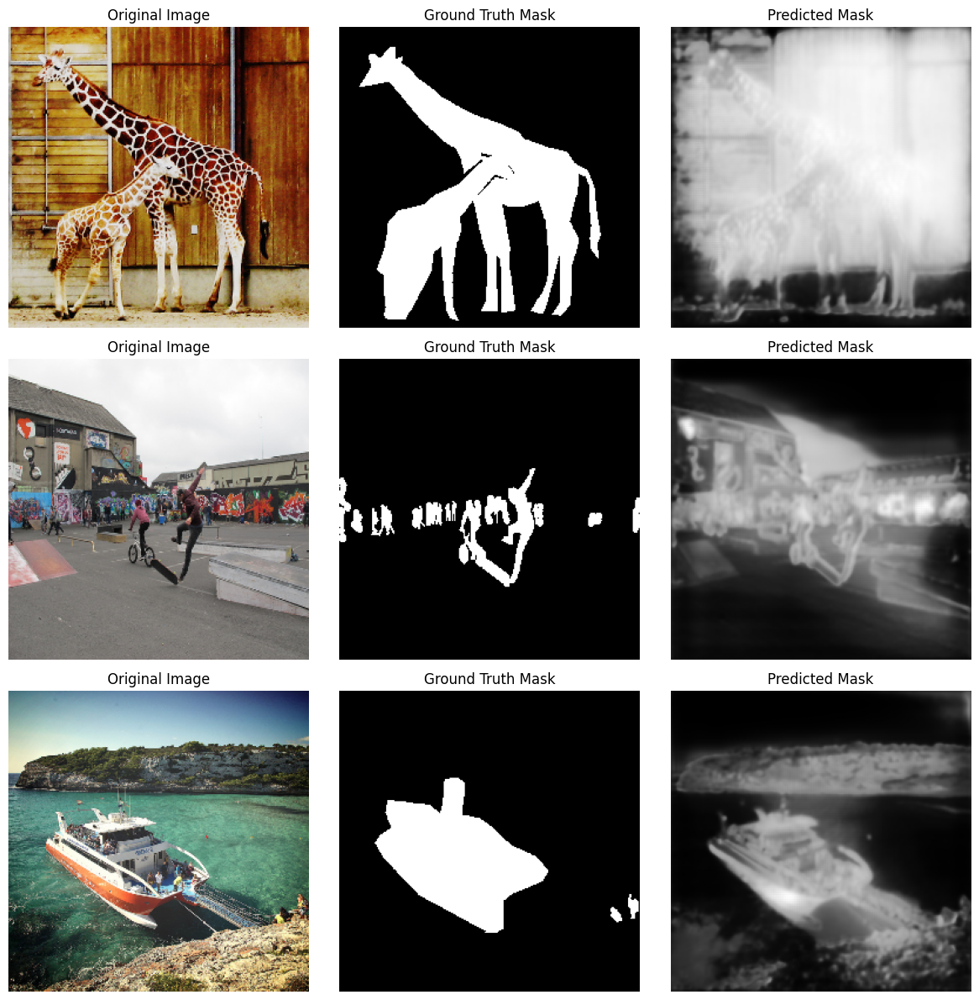

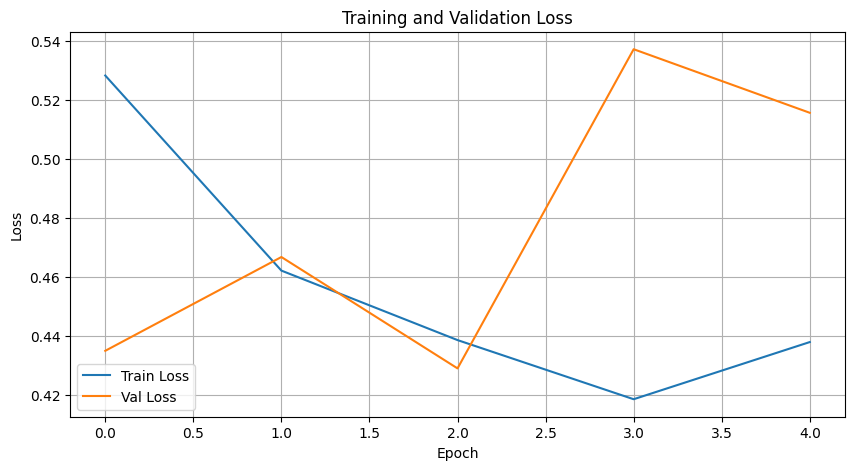


TRAINING COMPLETE!


In [10]:
if __name__ == "__main__":
    # Hyperparameters
    IMG_SIZE = 256
    BATCH_SIZE = 8
    NUM_EPOCHS = 5
    LEARNING_RATE = 0.001
    MAX_TRAIN_SAMPLES = 500  # Use subset for faster training
    MAX_VAL_SAMPLES = 50

    print("="*60)
    print("INITIALIZING DATASETS")
    print("="*60)

    # Create datasets
    train_dataset = COCOSegmentationDataset(
        TRAIN_IMG_PATH,
        TRAIN_ANN_PATH,
        img_size=IMG_SIZE,
        max_samples=MAX_TRAIN_SAMPLES
    )

    val_dataset = COCOSegmentationDataset(
        VAL_IMG_PATH,
        VAL_ANN_PATH,
        img_size=IMG_SIZE,
        max_samples=MAX_VAL_SAMPLES
    )

    # Create dataloaders
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

    print(f"Train batches: {len(train_loader)}")
    print(f"Val batches: {len(val_loader)}")

    print("\n" + "="*60)
    print("INITIALIZING MODEL")
    print("="*60)

    # Initialize model
    model = UNet(in_channels=3, out_channels=1).to(device)
    print(f"Model parameters: {sum(p.numel() for p in model.parameters()):,}")

    print("\n" + "="*60)
    print("STARTING TRAINING")
    print("="*60)

    # Train model
    train_losses, val_losses = train_model(
        model,
        train_loader,
        val_loader,
        num_epochs=NUM_EPOCHS,
        learning_rate=LEARNING_RATE
    )

    print("\n" + "="*60)
    print("SAVING MODEL")
    print("="*60)

    # Save model
    torch.save({
        'model_state_dict': model.state_dict(),
        'train_losses': train_losses,
        'val_losses': val_losses,
    }, MODEL_SAVE_PATH)
    print(f"Model saved to: {MODEL_SAVE_PATH}")

    print("\n" + "="*60)
    print("VISUALIZING RESULTS")
    print("="*60)

    # Visualize results
    visualize_predictions(model, val_dataset, num_samples=3)

    # Plot training curves
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    print("\n" + "="*60)
    print("TRAINING COMPLETE!")
    print("="*60)

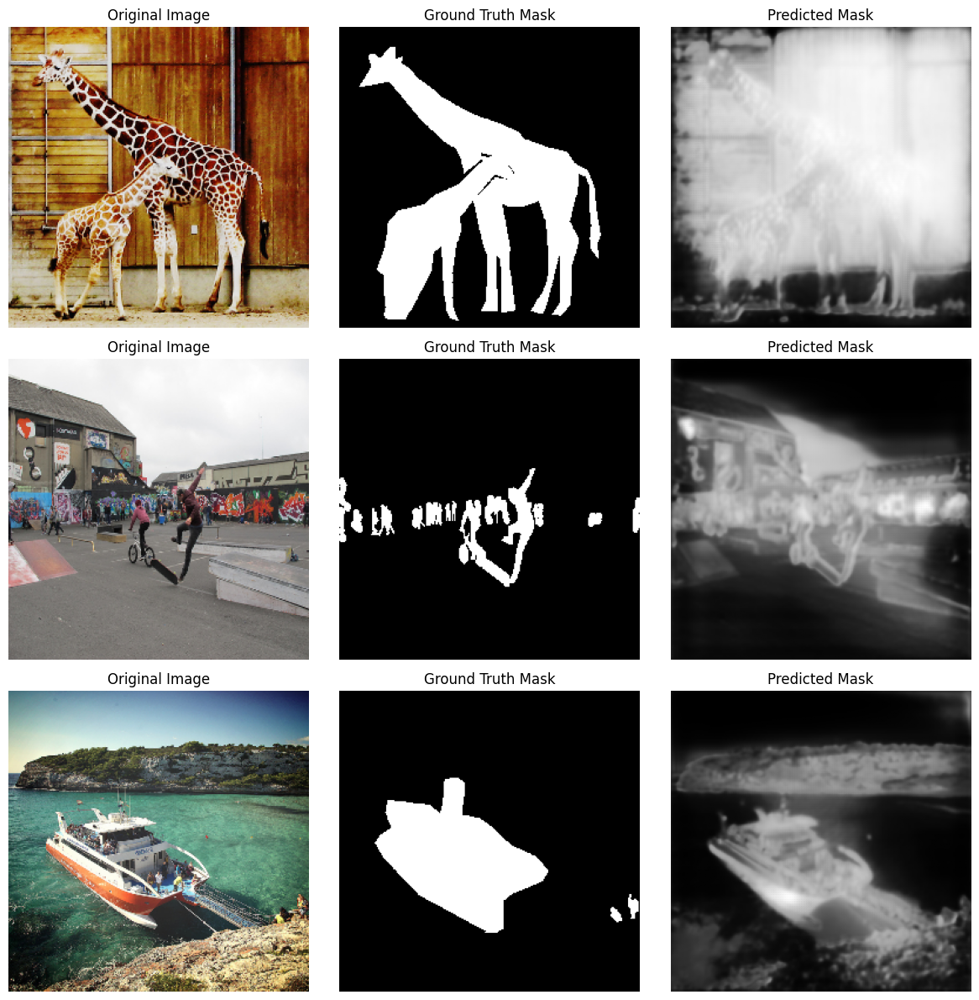

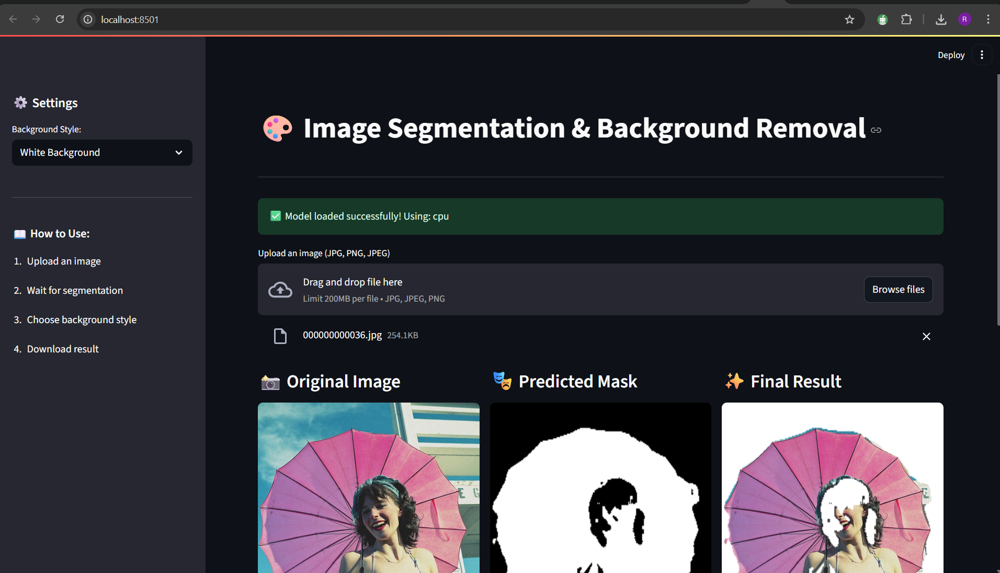

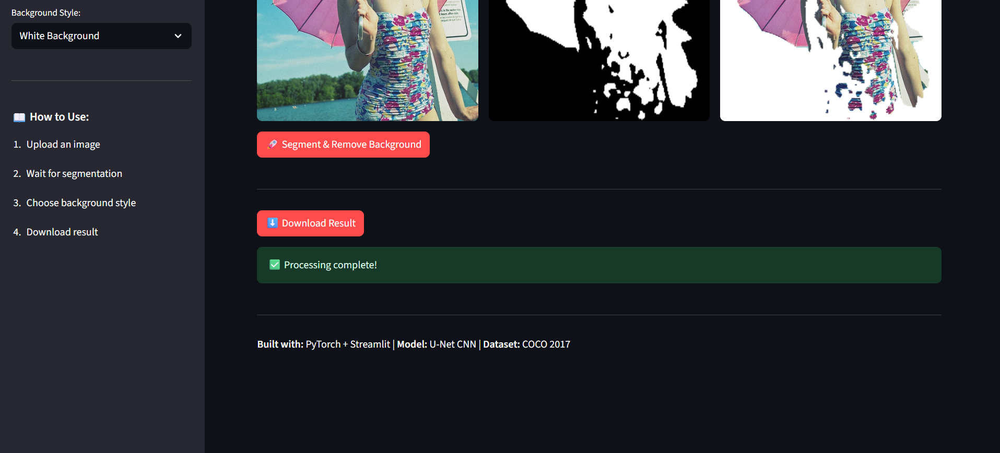